## Use Facebook Prophet Time Series to Predict Temperature

### Load libraries

In [1]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics

from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from pyspark.sql.types import *
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

### Start Spark Session and load CSV

In [2]:
spark = SparkSession.builder.appName("TimeSeriesAnalysis").getOrCreate()
df = spark.read.csv('All Cities.csv', header=True, inferSchema= True)
df = df.withColumn("time", to_timestamp("time", "yyyy-MM-dd"))
df.show(5)
df.createOrReplaceTempView("temp_timeseries")

23/05/08 14:34:57 WARN SparkSession: Using an existing Spark session; only runtime SQL configurations will take effect.


+--------+-------------------+-------+------------------+----------+-----------+-------------------+--------+--------+---------+-----------+----------+
|location|               time|summary|precipAccumulation|precipType|temperature|apparentTemperature|dewPoint|pressure|windSpeed|windBearing|cloudCover|
+--------+-------------------+-------+------------------+----------+-----------+-------------------+--------+--------+---------+-----------+----------+
| Atlanta|1980-01-01 00:00:00| Cloudy|              0.01|      rain|      41.41|              35.48|   37.81|  977.74|     9.69|     281.63|       0.0|
| Atlanta|1980-01-01 01:00:00| Cloudy|               0.0|      rain|      41.29|              35.35|   38.14|  977.44|     9.67|     280.82|       0.0|
| Atlanta|1980-01-01 02:00:00| Cloudy|              0.01|      rain|      41.41|              35.55|   38.59|  976.92|     9.53|     280.98|       0.0|
| Atlanta|1980-01-01 03:00:00| Cloudy|              0.01|      rain|      40.39|        

### Define function that will build the model, forecast and plot

In [3]:
def forecast_temps(city):
    df_day_temps = spark.sql(f"""
                            SELECT DATE_TRUNC('day', time) AS ds,
                            AVG(temperature) AS y
                            FROM temp_timeseries
                            WHERE location='{city}'
                            GROUP BY ds
                            ORDER BY ds
                            """)
    
    # set the column headers as Prophet expects
    df_day_temps = df_day_temps.withColumnRenamed("DATE_TRUNC('day', time)", "ds") \
                               .withColumnRenamed("AVG(temperature)", "y")
    
    # instantiate the model and set parameters
    model = Prophet(
                    interval_width=0.85,
                    growth='linear',
                    daily_seasonality=False,
                    weekly_seasonality=False,
                    yearly_seasonality=True,
                    seasonality_mode='additive'
                    )

    # fit the model to historical data
    df_day_temps = df_day_temps.select(date_format('ds', 'yyyy-MM-dd').alias('ds'), col('y'))
    pd_df = df_day_temps.toPandas()
    model.fit(pd_df)

    # Predict future temperatures
    future_pd = model.make_future_dataframe(
                                            periods=1460,
                                            freq='d',
                                            include_history=True
                                            )
    forecast_pd = model.predict(future_pd)
    
    # Plot forecast and components
    sns.set_theme(font_scale=1.75, style=None)
    fig, ax = plt.subplots(figsize=(24, 10))
    model.plot(forecast_pd, xlabel='date', ylabel='temperature', include_legend=True, ax=ax)
    ax.set_xlabel('Temperature', fontsize=20)
    ax.set_ylabel('Year', fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=20)
    plt.legend(fontsize=20)
    plt.suptitle(f'Forecast Temperatures for {city}', fontsize=28)
    plt.tight_layout()
    plt.show()

    fig_comp = model.plot_components(forecast_pd, figsize=(24, 18))
    fig_comp.suptitle(f'{city} Trend', fontsize=28)
    fig_comp.tight_layout()
    plt.show()
    
    return model

### Model, forecast and plot for each city

In [4]:
def get_min_max(col, df):
    min_val  = df_pm[col].min()
    min_val_horiz = df_pm[df_pm[col]==df_pm[col].min()]['horizon'].item().days
    
    max_val  = df_pm[col].min()
    max_val_horiz = df_pm[df_pm[col]==df_pm[col].max()]['horizon'].item().days
    
    col_mean = df_pm['rmse'].mean()
    
    return [f'{np.round(min_val, 4)} ({min_val_horiz})',
            f'{np.round(max_val, 4)} ({max_val_horiz})',
            np.round(col_mean, 4)]
    
def get_metrics(city, df):
    row = [city]
    row.extend(get_min_max('mse', df))
    row.extend(get_min_max('rmse', df))
    row.extend(get_min_max('mae', df))
               
    return row

14:35:20 - cmdstanpy - INFO - Chain [1] start processing                        
14:35:22 - cmdstanpy - INFO - Chain [1] done processing


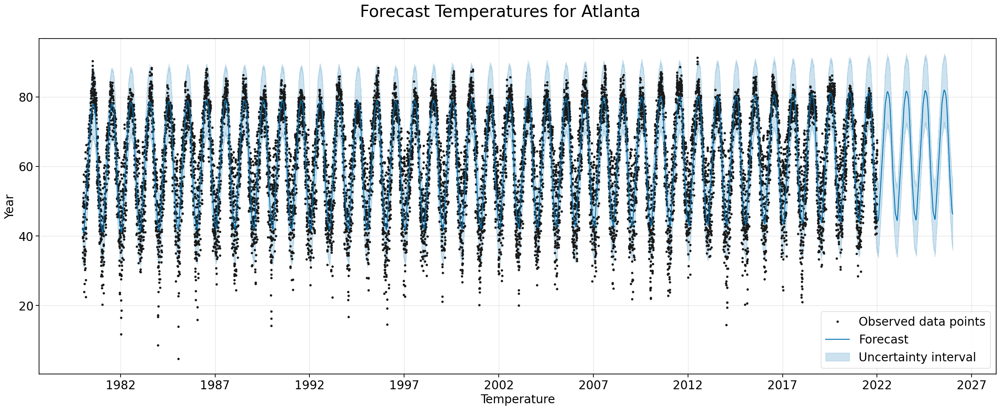

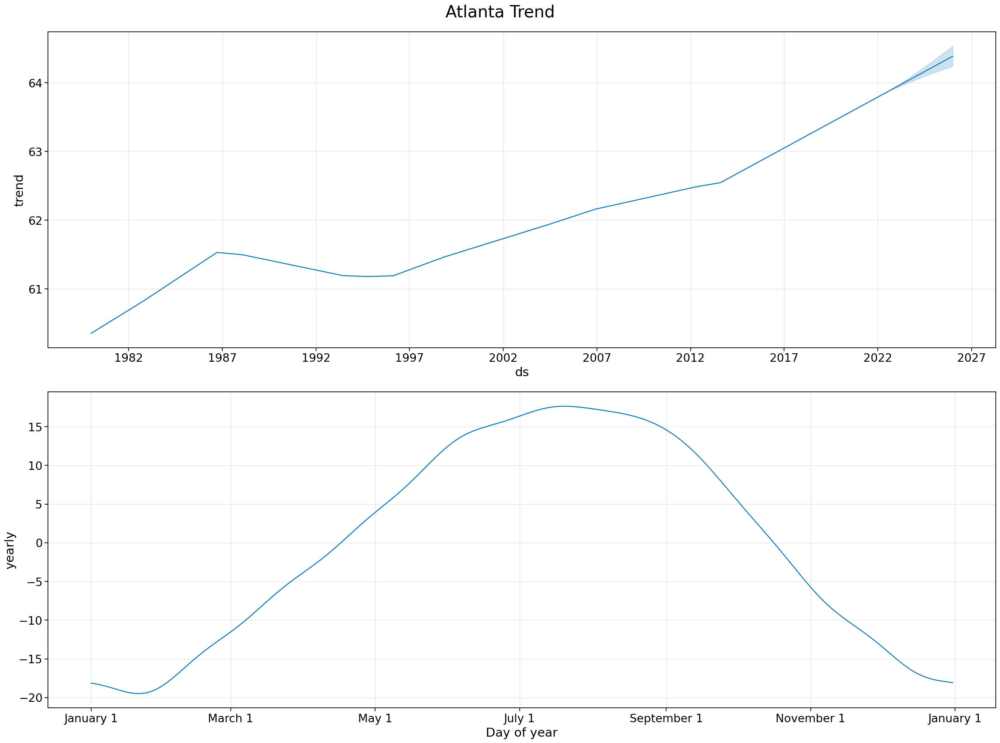

  0%|          | 0/1 [00:00<?, ?it/s]

14:35:26 - cmdstanpy - INFO - Chain [1] start processing
14:35:27 - cmdstanpy - INFO - Chain [1] done processing
14:35:32 - cmdstanpy - INFO - Chain [1] start processing                        
14:35:33 - cmdstanpy - INFO - Chain [1] done processing


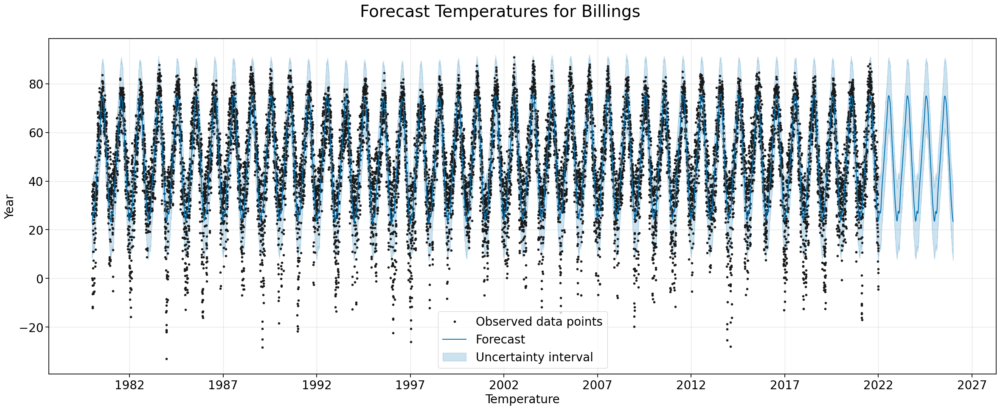

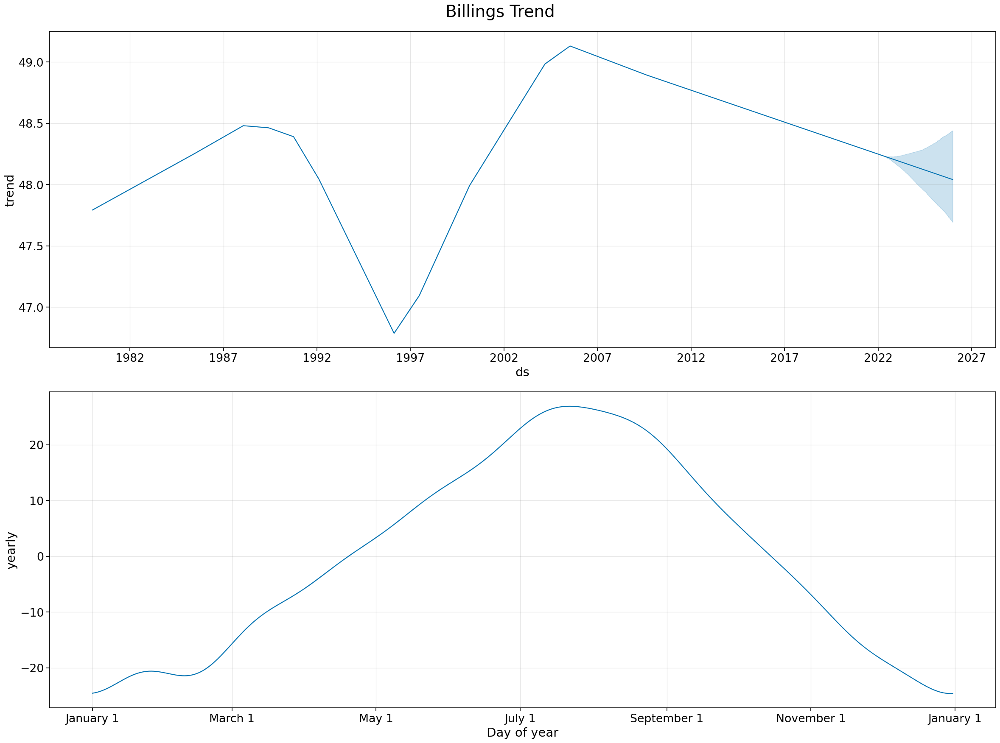

  0%|          | 0/1 [00:00<?, ?it/s]

14:35:38 - cmdstanpy - INFO - Chain [1] start processing
14:35:39 - cmdstanpy - INFO - Chain [1] done processing
14:35:44 - cmdstanpy - INFO - Chain [1] start processing                        
14:35:46 - cmdstanpy - INFO - Chain [1] done processing


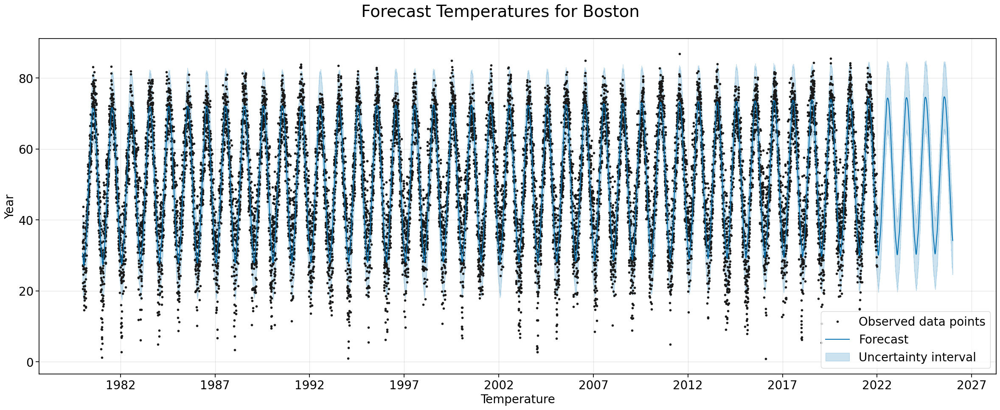

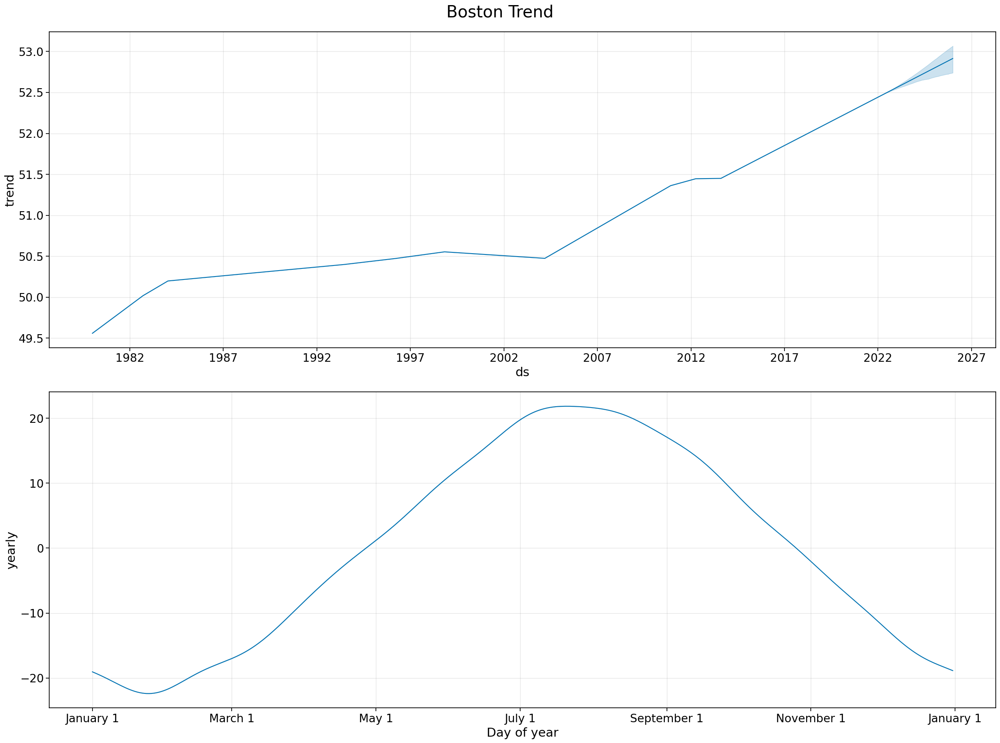

  0%|          | 0/1 [00:00<?, ?it/s]

14:35:51 - cmdstanpy - INFO - Chain [1] start processing
14:35:51 - cmdstanpy - INFO - Chain [1] done processing
14:35:56 - cmdstanpy - INFO - Chain [1] start processing                        
14:35:58 - cmdstanpy - INFO - Chain [1] done processing


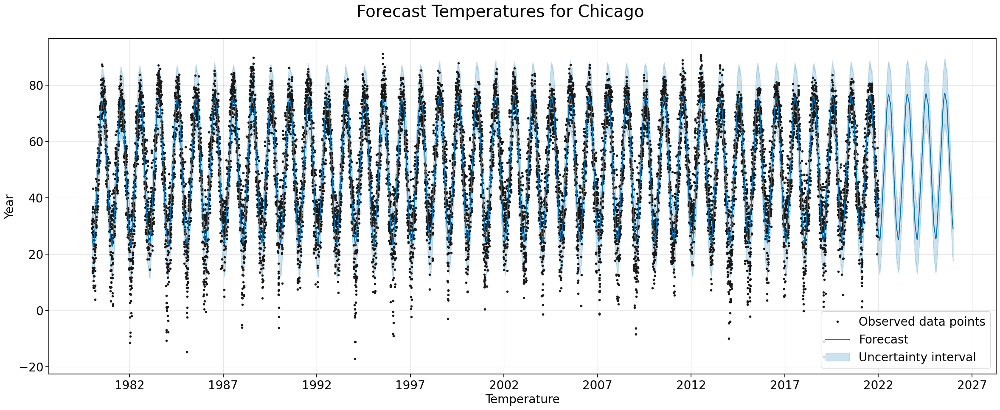

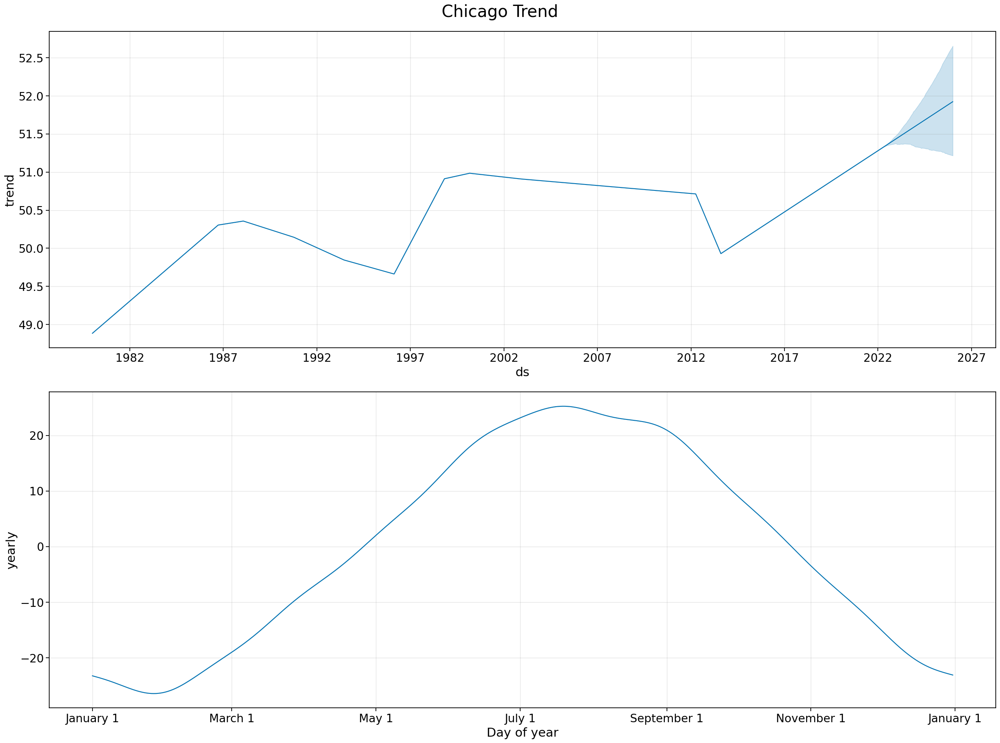

  0%|          | 0/1 [00:00<?, ?it/s]

14:36:03 - cmdstanpy - INFO - Chain [1] start processing
14:36:05 - cmdstanpy - INFO - Chain [1] done processing
14:36:09 - cmdstanpy - INFO - Chain [1] start processing                        
14:36:11 - cmdstanpy - INFO - Chain [1] done processing


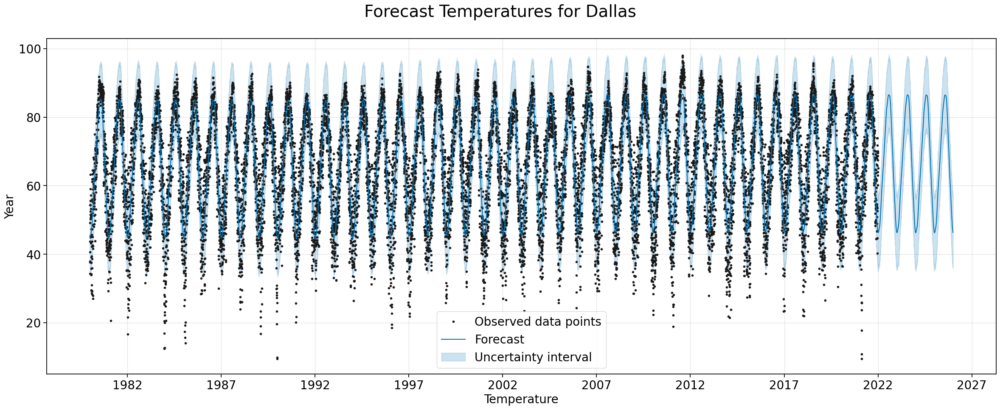

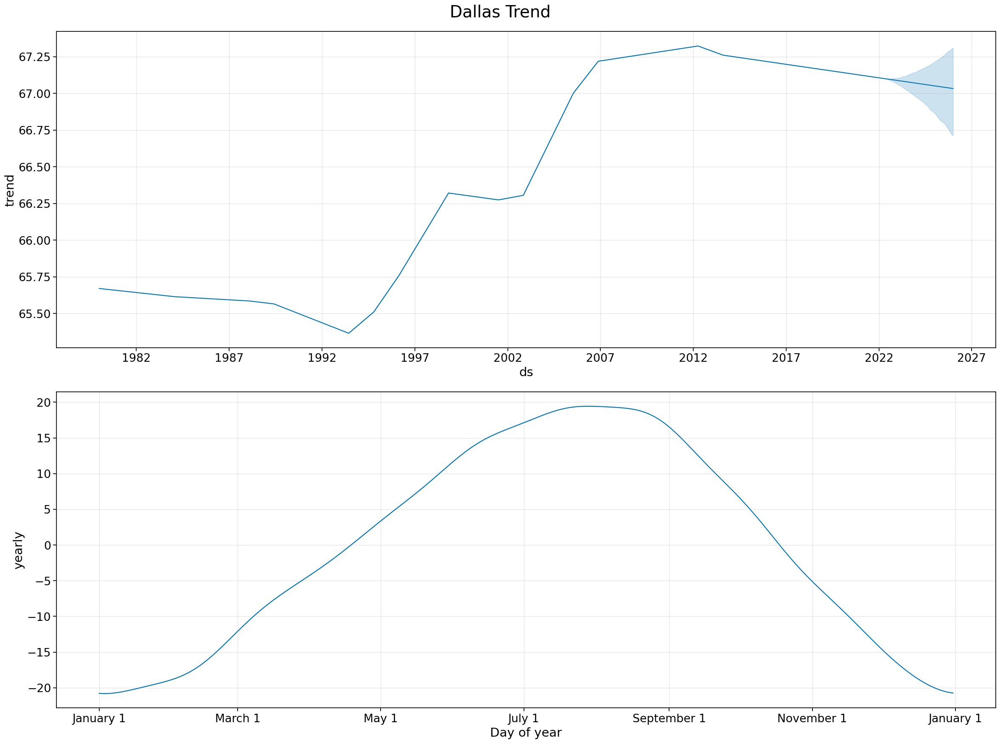

  0%|          | 0/1 [00:00<?, ?it/s]

14:36:16 - cmdstanpy - INFO - Chain [1] start processing
14:36:17 - cmdstanpy - INFO - Chain [1] done processing
14:36:21 - cmdstanpy - INFO - Chain [1] start processing                        
14:36:23 - cmdstanpy - INFO - Chain [1] done processing


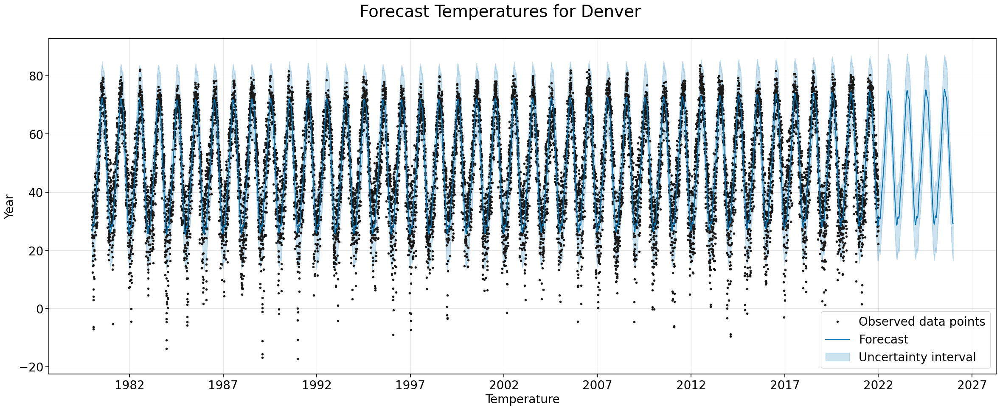

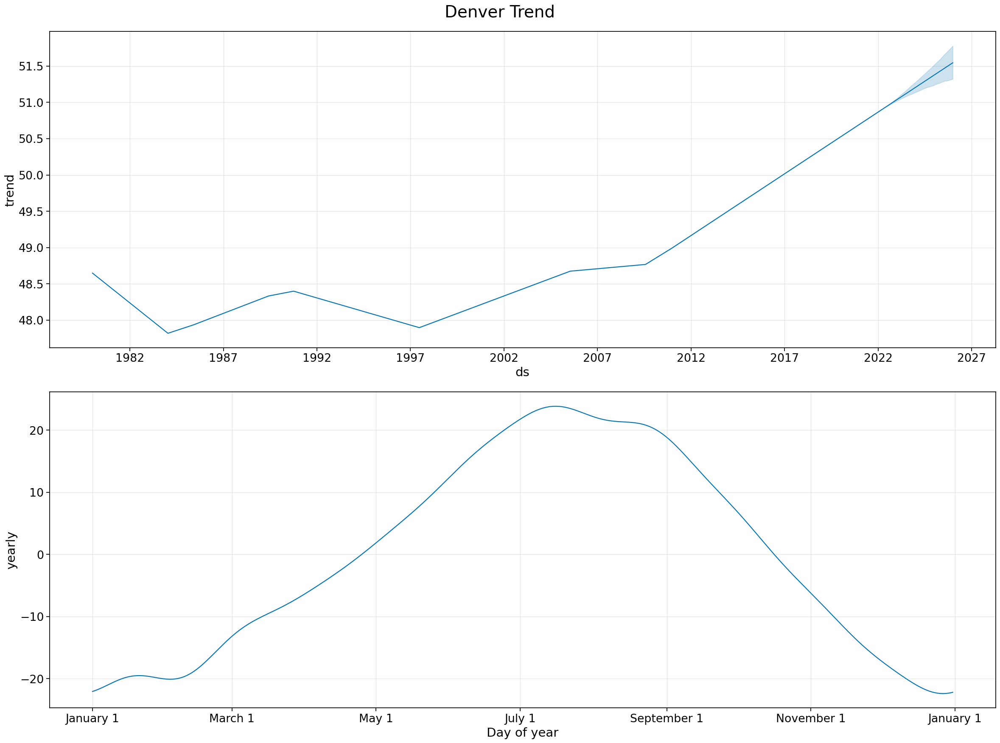

  0%|          | 0/1 [00:00<?, ?it/s]

14:36:28 - cmdstanpy - INFO - Chain [1] start processing
14:36:29 - cmdstanpy - INFO - Chain [1] done processing
14:36:34 - cmdstanpy - INFO - Chain [1] start processing                        
14:36:35 - cmdstanpy - INFO - Chain [1] done processing


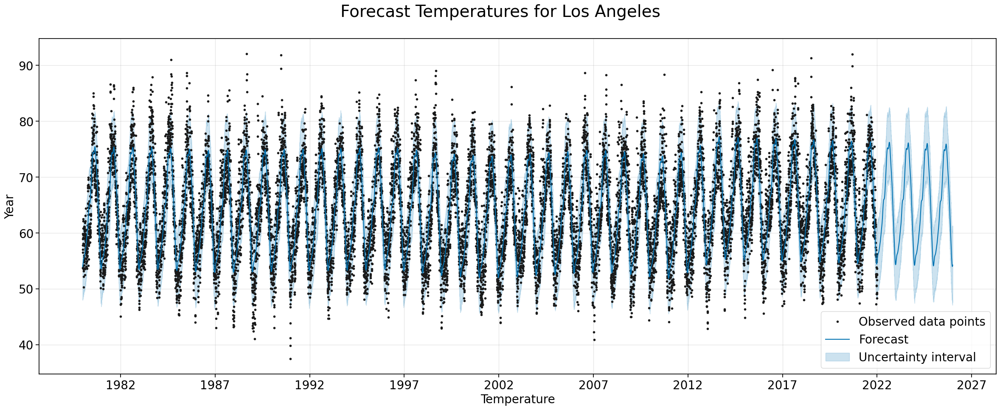

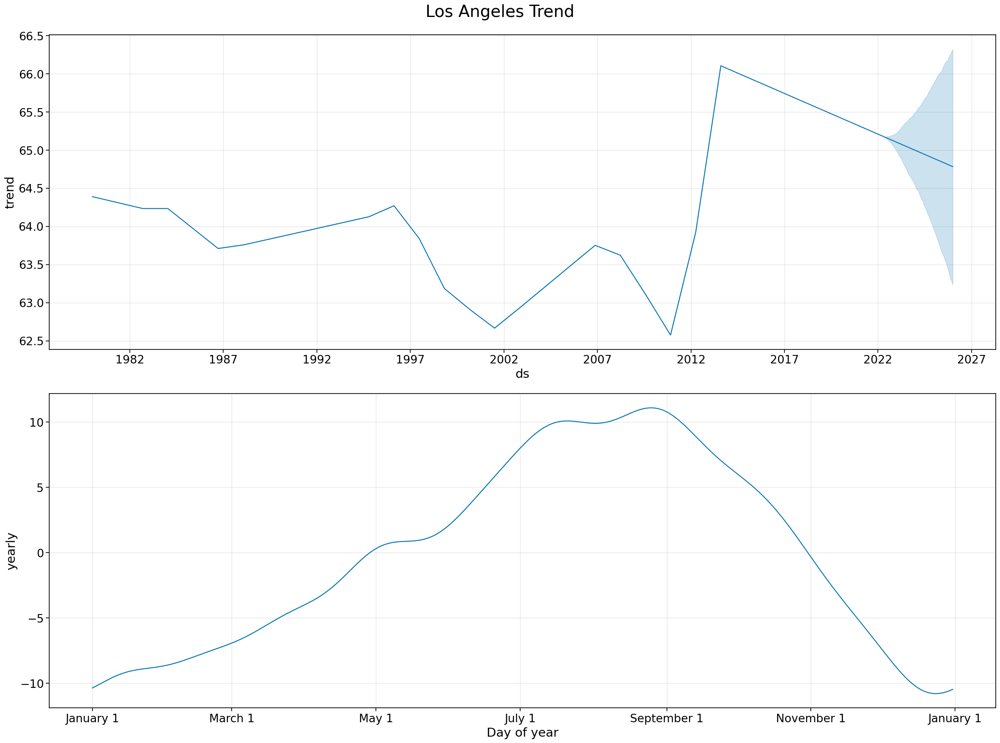

  0%|          | 0/1 [00:00<?, ?it/s]

14:36:40 - cmdstanpy - INFO - Chain [1] start processing
14:36:42 - cmdstanpy - INFO - Chain [1] done processing
14:36:46 - cmdstanpy - INFO - Chain [1] start processing                        
14:36:49 - cmdstanpy - INFO - Chain [1] done processing


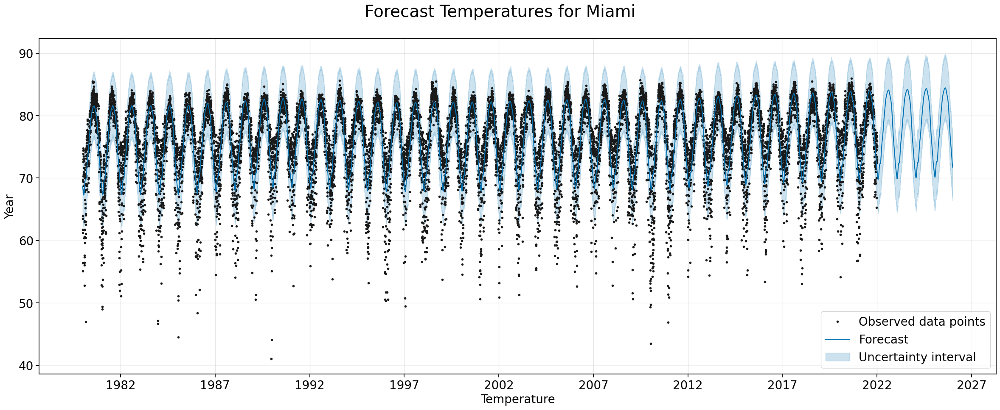

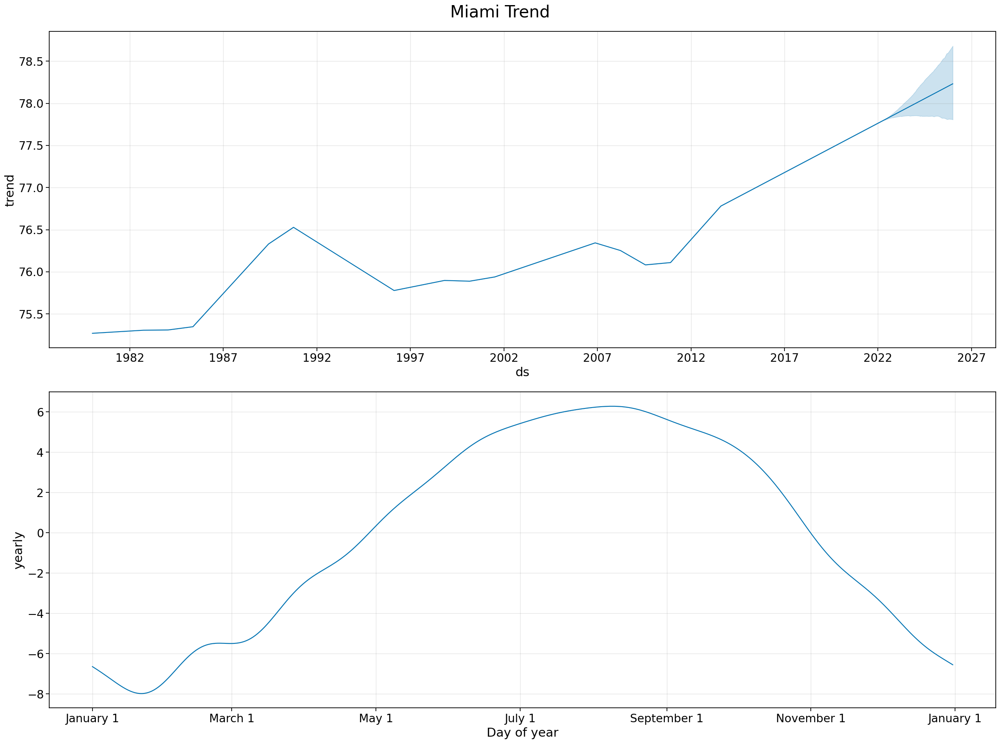

  0%|          | 0/1 [00:00<?, ?it/s]

14:36:54 - cmdstanpy - INFO - Chain [1] start processing
14:36:55 - cmdstanpy - INFO - Chain [1] done processing
14:37:00 - cmdstanpy - INFO - Chain [1] start processing                        
14:37:01 - cmdstanpy - INFO - Chain [1] done processing


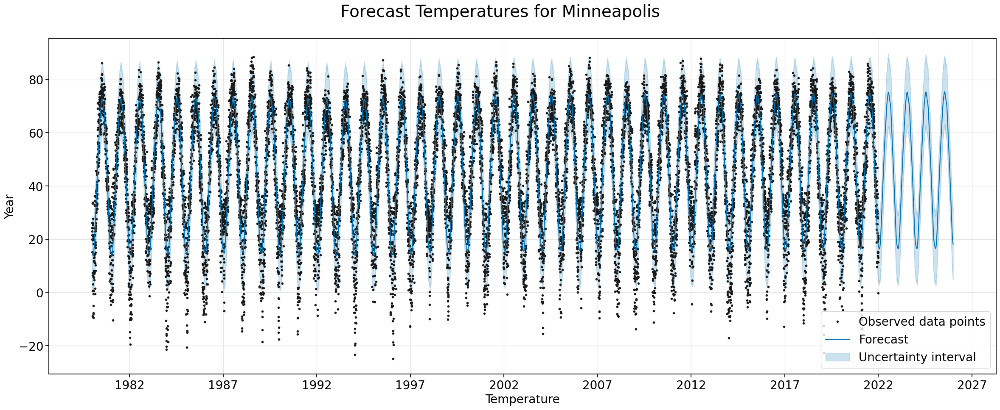

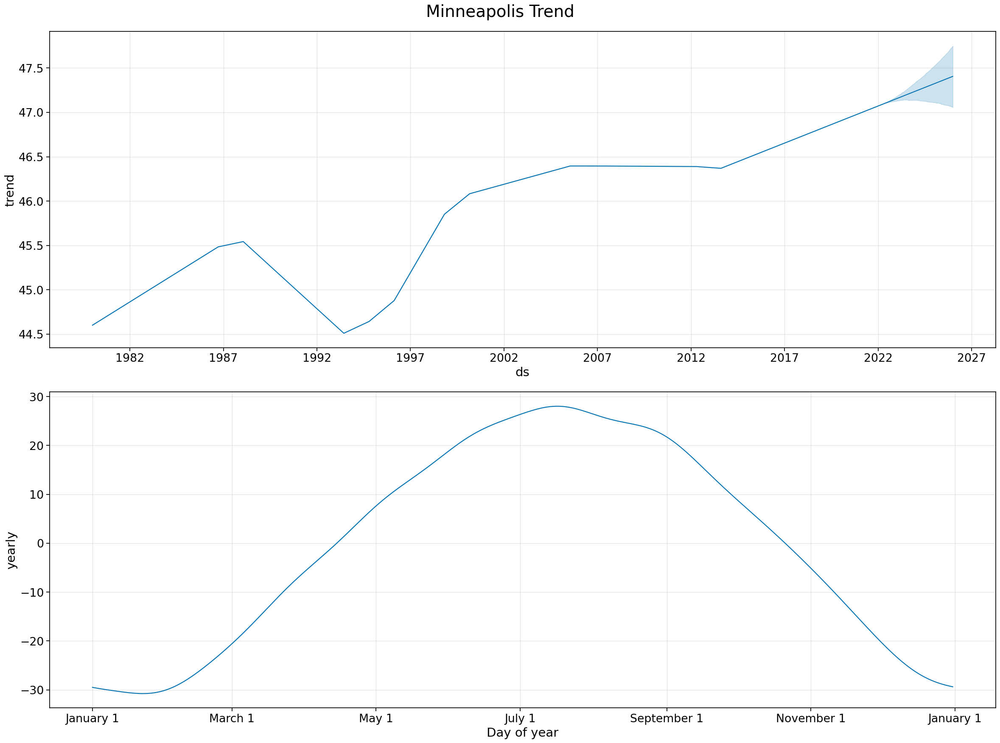

  0%|          | 0/1 [00:00<?, ?it/s]

14:37:06 - cmdstanpy - INFO - Chain [1] start processing
14:37:07 - cmdstanpy - INFO - Chain [1] done processing
14:37:11 - cmdstanpy - INFO - Chain [1] start processing                        
14:37:13 - cmdstanpy - INFO - Chain [1] done processing


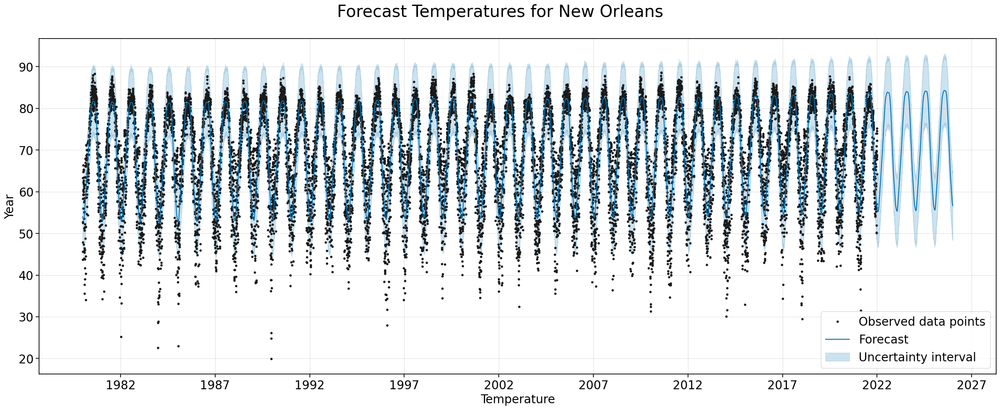

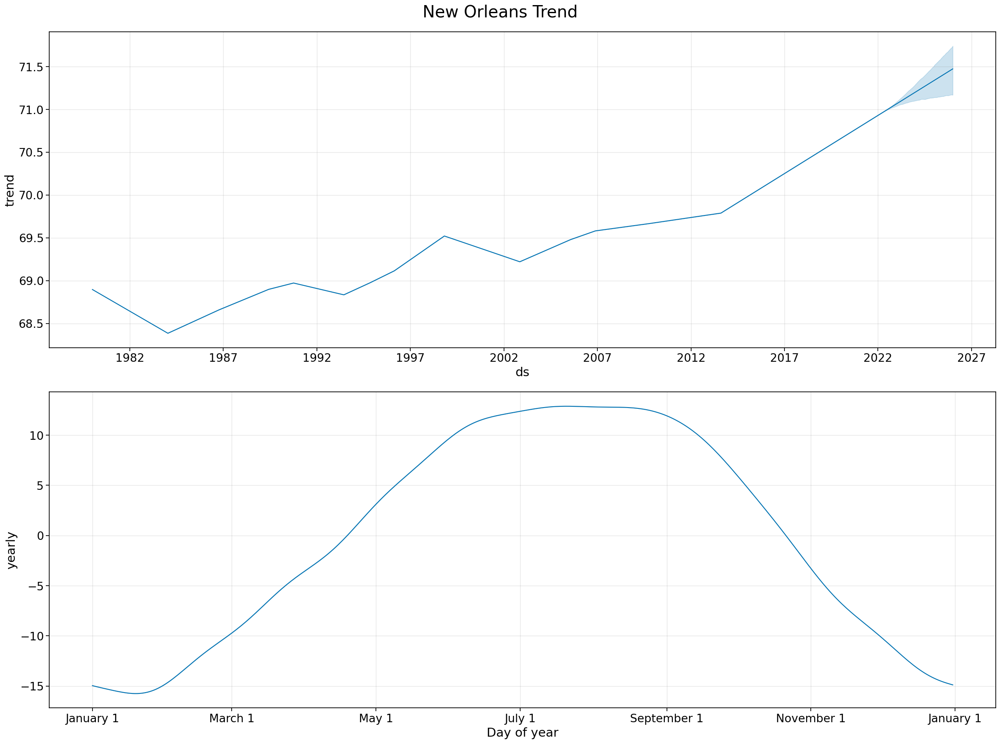

  0%|          | 0/1 [00:00<?, ?it/s]

14:37:17 - cmdstanpy - INFO - Chain [1] start processing
14:37:18 - cmdstanpy - INFO - Chain [1] done processing
14:37:23 - cmdstanpy - INFO - Chain [1] start processing                        
14:37:24 - cmdstanpy - INFO - Chain [1] done processing


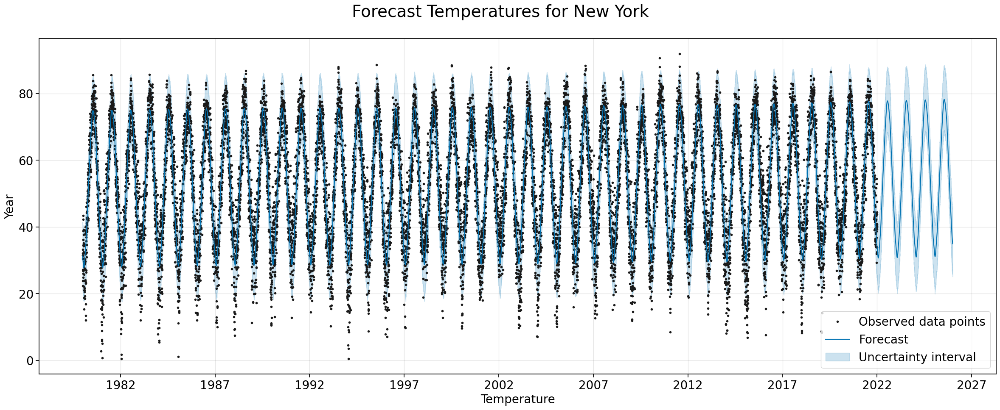

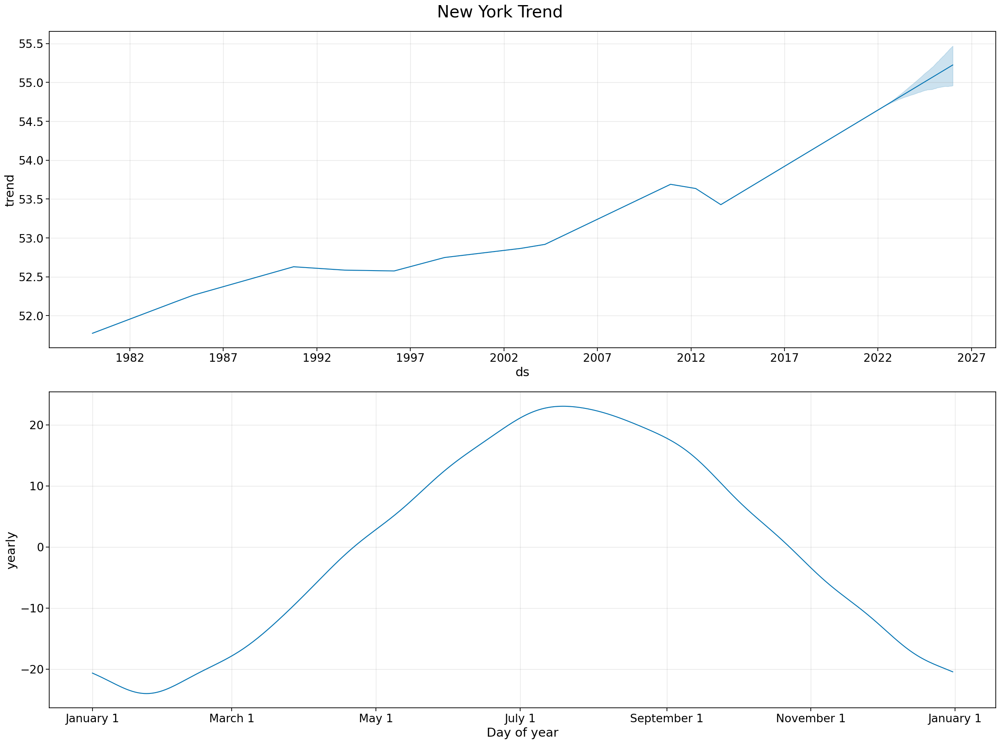

  0%|          | 0/1 [00:00<?, ?it/s]

14:37:29 - cmdstanpy - INFO - Chain [1] start processing
14:37:30 - cmdstanpy - INFO - Chain [1] done processing
14:37:34 - cmdstanpy - INFO - Chain [1] start processing                        
14:37:38 - cmdstanpy - INFO - Chain [1] done processing


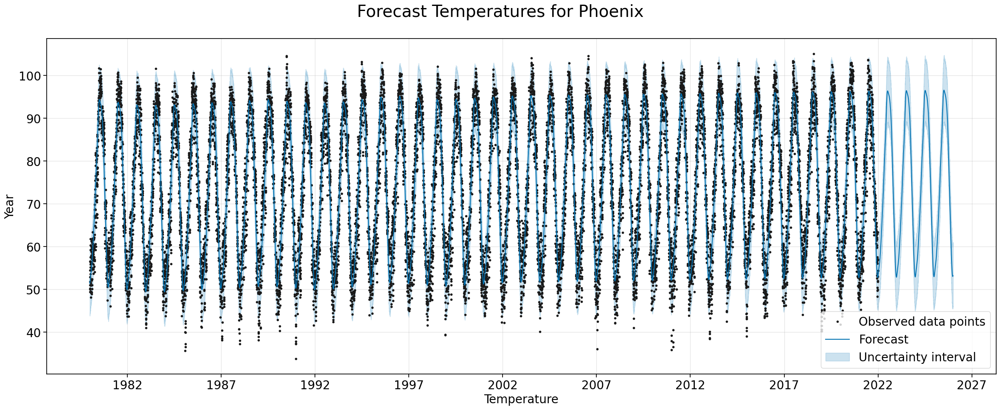

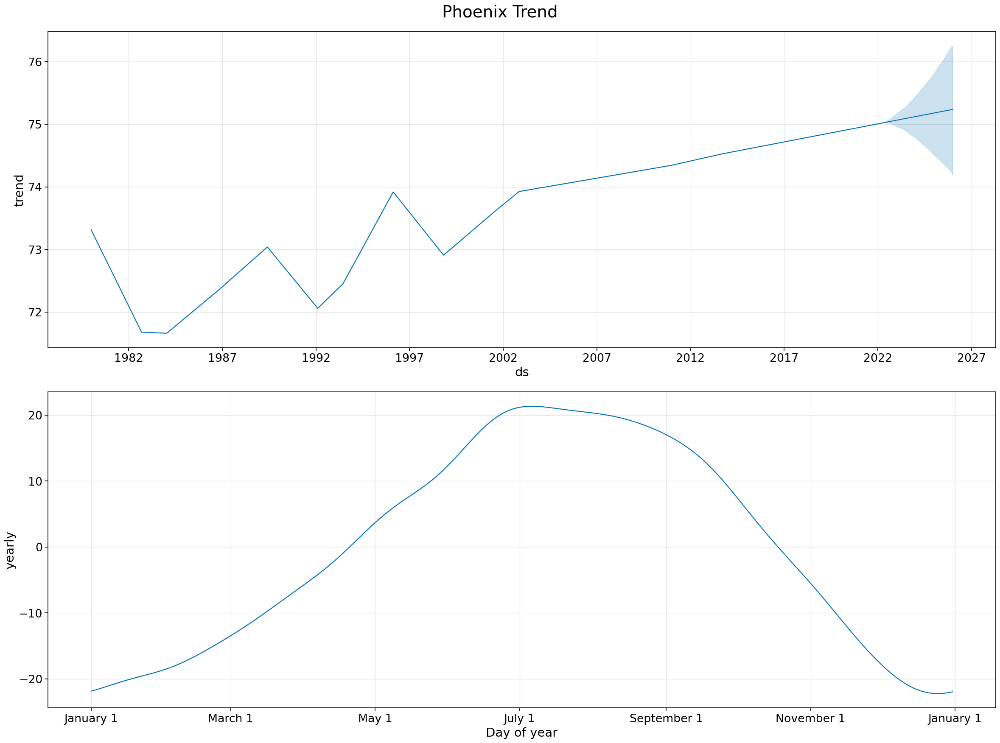

  0%|          | 0/1 [00:00<?, ?it/s]

14:37:43 - cmdstanpy - INFO - Chain [1] start processing
14:37:44 - cmdstanpy - INFO - Chain [1] done processing
14:37:49 - cmdstanpy - INFO - Chain [1] start processing                        
14:37:54 - cmdstanpy - INFO - Chain [1] done processing


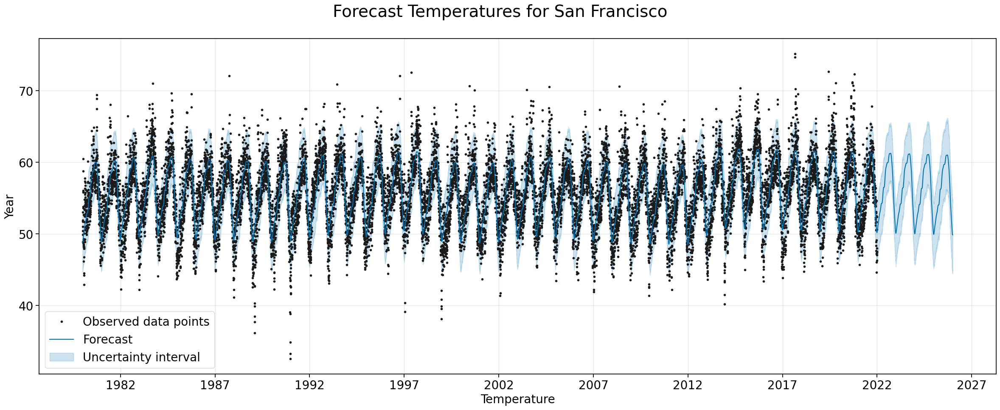

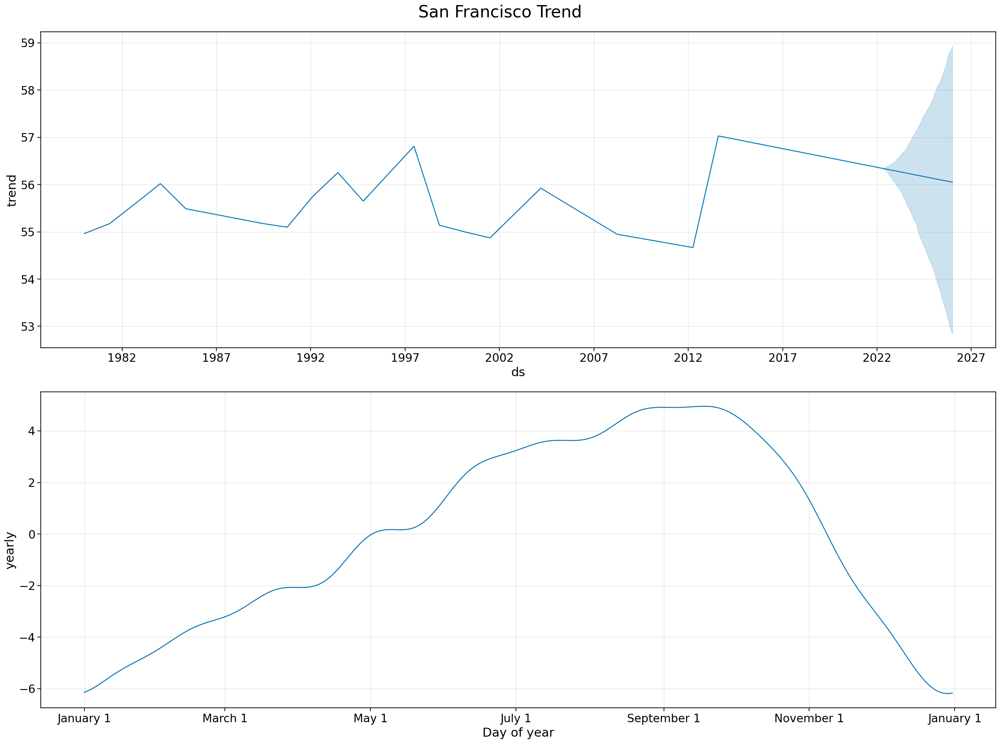

  0%|          | 0/1 [00:00<?, ?it/s]

14:37:59 - cmdstanpy - INFO - Chain [1] start processing
14:38:02 - cmdstanpy - INFO - Chain [1] done processing
14:38:06 - cmdstanpy - INFO - Chain [1] start processing                        
14:38:10 - cmdstanpy - INFO - Chain [1] done processing


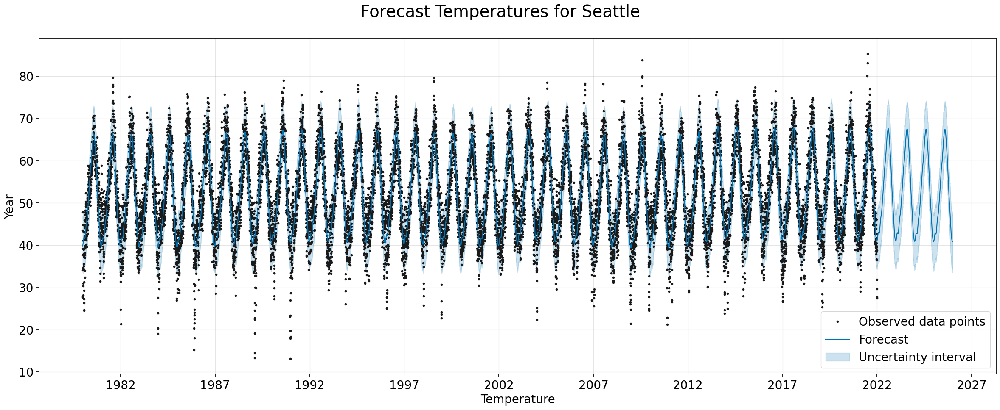

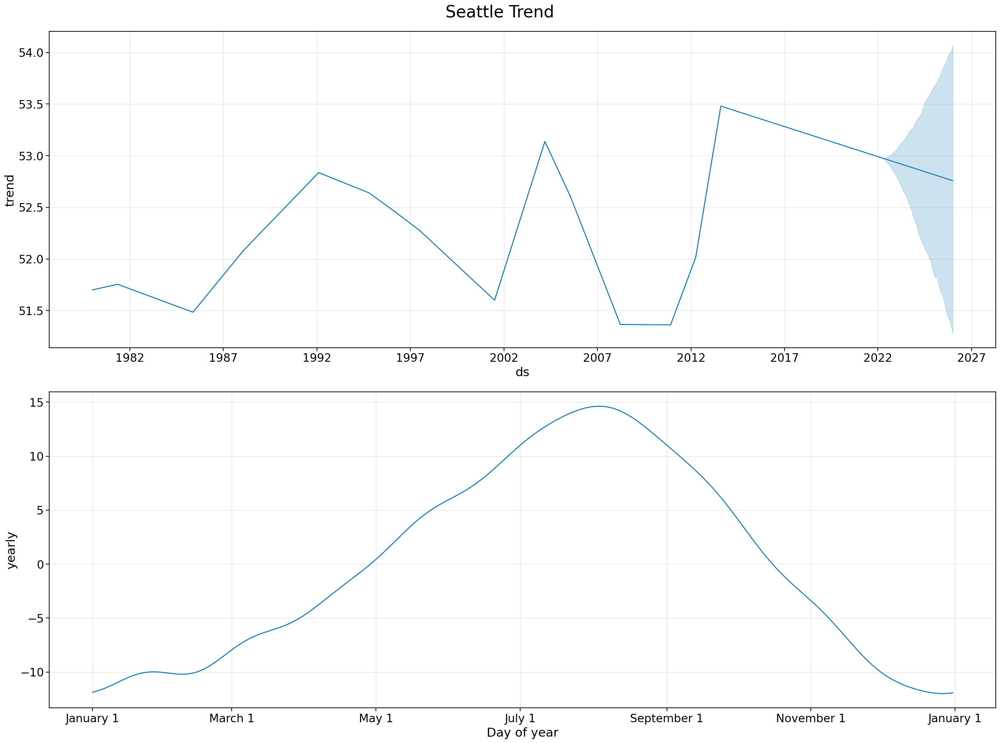

  0%|          | 0/1 [00:00<?, ?it/s]

14:38:15 - cmdstanpy - INFO - Chain [1] start processing
14:38:16 - cmdstanpy - INFO - Chain [1] done processing
14:38:20 - cmdstanpy - INFO - Chain [1] start processing                        
14:38:22 - cmdstanpy - INFO - Chain [1] done processing


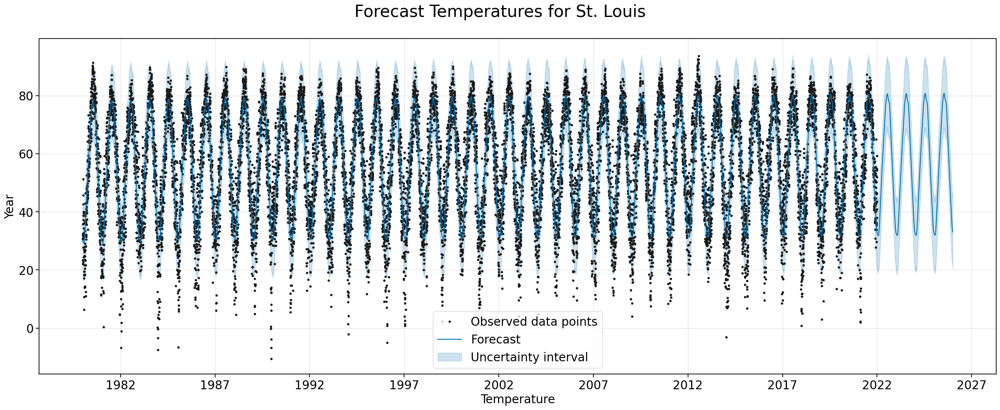

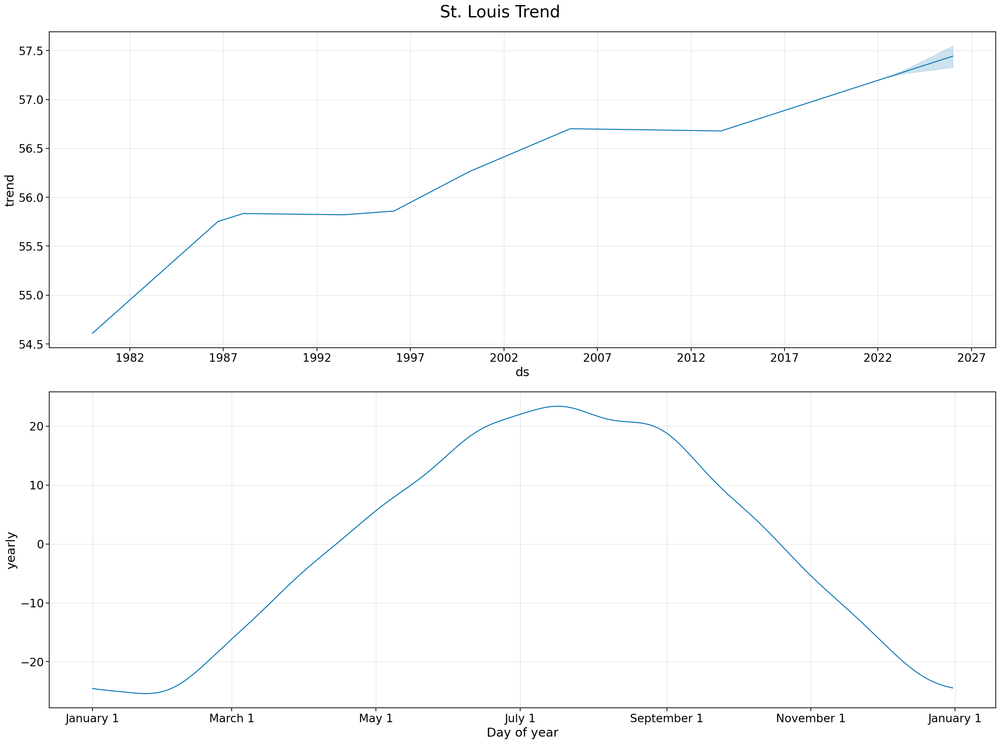

  0%|          | 0/1 [00:00<?, ?it/s]

14:38:27 - cmdstanpy - INFO - Chain [1] start processing
14:38:28 - cmdstanpy - INFO - Chain [1] done processing
14:38:32 - cmdstanpy - INFO - Chain [1] start processing                        
14:38:33 - cmdstanpy - INFO - Chain [1] done processing


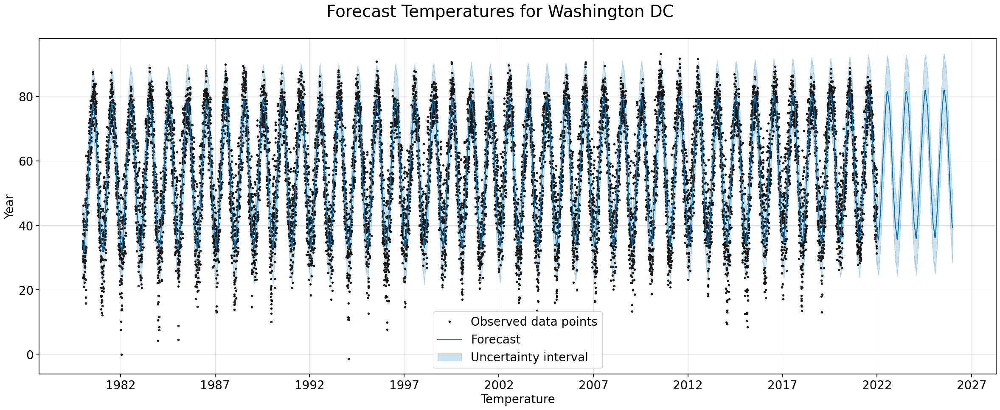

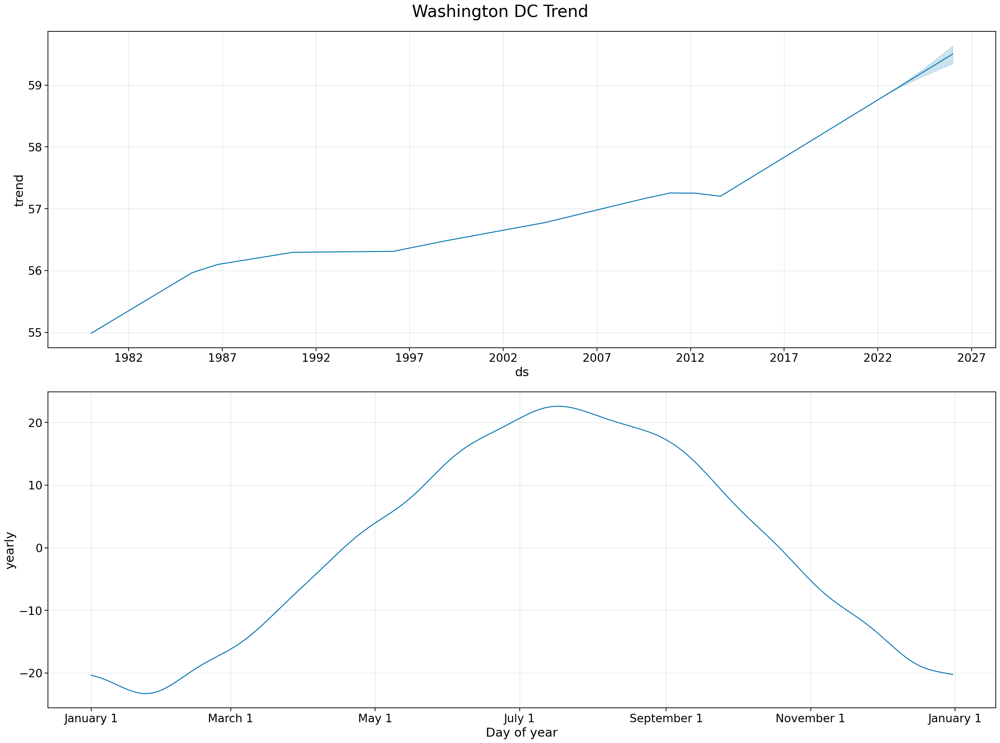

  0%|          | 0/1 [00:00<?, ?it/s]

14:38:39 - cmdstanpy - INFO - Chain [1] start processing
14:38:39 - cmdstanpy - INFO - Chain [1] done processing


,Minimum MSE (horizon days),Maximum MSE (horizon days),Average MSE,Minimum RMSE (horizon days),Maximum RMSE (horizon days),Average RMSE,Minimum MAE (horizon days),Maximum MAE (horizon days),Average MAE
City,,,,,,,,,
Atlanta,33.2309 (4259),33.2309 (2977),6.9152,5.7646 (4259),5.7646 (2977),6.9152,4.3871 (4268),4.3871 (2977),6.9152
Billings,65.7745 (1329),65.7745 (1870),10.2804,8.1101 (1329),8.1101 (1870),10.2804,6.3374 (1324),6.3374 (1870),10.2804
Boston,31.8624 (1343),31.8624 (2978),6.9078,5.6447 (1343),5.6447 (2978),6.9078,4.3955 (628),4.3955 (2268),6.9078
Chicago,47.2308 (607),47.2308 (1900),8.2897,6.8725 (607),6.8725 (1900),8.2897,5.3357 (607),5.3357 (1900),8.2897
Dallas,30.3217 (2415),30.3217 (1895),7.6387,5.5065 (2415),5.5065 (1895),7.6387,4.0369 (2415),4.0369 (712),7.6387
Denver,53.2025 (602),53.2025 (2916),8.6494,7.294 (602),7.294 (2916),8.6494,5.5086 (602),5.5086 (2910),8.6494
Los Angeles,13.2094 (3579),13.2094 (2252),4.5652,3.6345 (3579),3.6345 (2252),4.5652,2.9097 (3579),2.9097 (2252),4.5652
Miami,6.5323 (2791),6.5323 (438),3.3752,2.5558 (2791),2.5558 (438),3.3752,1.778 (944),1.778 (438),3.3752
Minneapolis,59.9428 (606),59.9428 (1896),9.3677,7.7423 (606),7.7423 (1896),9.3677,6.0191 (606),6.0191 (1896),9.3677


CPU times: user 2min 9s, sys: 27.5 s, total: 2min 37s
Wall time: 3min 26s


In [5]:
%%time
cols = ['City', 
        'Minimum MSE (horizon days)', 'Maximum MSE (horizon days)', 'Average MSE',
        'Minimum RMSE (horizon days)', 'Maximum RMSE (horizon days)', 'Average RMSE',
        'Minimum MAE (horizon days)', 'Maximum MAE (horizon days)', 'Average MAE']

df_metrics = pd.DataFrame(columns=cols)
cities = spark.sql("SELECT DISTINCT(location) FROM temp_timeseries ORDER BY location").collect()
for i, city in enumerate(cities):
    
    model = forecast_temps(city[0])
    
    # Train model on first 30 years; predict each year for 2010-2021
    df_cv = cross_validation(model, initial='10957 days', period='365 days', horizon = '4382 days')
    df_pm = performance_metrics(df_cv)
    

    df_metrics.loc[i] = get_metrics(city[0], df_pm)

df_metrics.set_index(['City'], inplace=True)
display(df_metrics)